# Diabetic Retinopathy Image Classification Preprocessing

In [22]:

%load_ext autoreload
%autoreload 2

import pandas as pd
import sys
import joblib
from torchvision.models import ResNet18_Weights

fp_project_folder = "../../"
sys.path.append(fp_project_folder)

from src.configs.image_config import fp_dataset_csv_file, ori_col_info
from src.preprocessing.image_preprocessing import process_image_df, split_df, \
    remove_rows_where_any_image_is_missing_or_truncated
from src.configs.image_config import fp_data_dfs_file
from src.preprocessing.pytorch_preprocessing import BaselineImageDataset, AEImageDataset, ICImageDataset, BCImageDataset
from src.image_eda import show_img_examples, show_ae_img_examples, show_ic_img_examples, show_bc_img_examples, \
    get_class_distribution
from src.preprocessing.pytorch_preprocessing import get_pytorch_split_dict, \
    get_baseline_image_dl, get_ae_image_dl, get_ic_image_dl, get_bc_image_dl

seed_no = 2024
batch_size = 64
eval_batch_size = 64

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load Data DF

In [2]:
df = pd.read_csv(fp_dataset_csv_file)
df

,image,level
0,10_left,0
1,10_right,0
2,13_left,0
3,13_right,0
4,15_left,1
...,...,...
35121,44347_right,0
35122,44348_left,0
35123,44348_right,0
35124,44349_left,0


In [3]:
processed_df, col_info = process_image_df(df, col_info=ori_col_info)
display(processed_df)
col_info

  0%|          | 0/35126 [00:00<?, ?it/s]

,image_left,image_right,level_left,level_right,level_id,4>=_left,3>=_left,2>=_left,1>=_left,0>=_left,4>=_right,3>=_right,2>=_right,1>=_right,0>=_right,4>=_id,3>=_id,2>=_id,1>=_id,0>=_id
id,,,,,,,,,,,,,,,,,,,,
10,10_left,10_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
13,13_left,13_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
15,15_left,15_right,1,2,2,1,1,1,1,0,1,1,1,0,0,1,1,1,0,0
16,16_left,16_right,4,4,4,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0
17,17_left,17_right,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44339,44339_left,44339_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
44343,44343_left,44343_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
44347,44347_left,44347_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


{'id_col': 'id',
 'image_col': 'image',
 'left_label': '_left',
 'right_label': '_right',
 'index_cols': ['id', 'eye'],
 'ordinal_output_cols': ['4>=', '3>=', '2>=', '1>=', '0>='],
 'output_col': 'level',
 'num_classes': 5}

In [4]:
processed_df = remove_rows_where_any_image_is_missing_or_truncated(processed_df)

  0%|          | 0/17563 [00:00<?, ?it/s]

Before: 17563
- Removed: -197
After: 17366


## Split Data Set

In [5]:
data_dfs = split_df(processed_df,  valid_prop=0.1, test_prop=0.2, seed=seed_no)
for df_label, cur_df in data_dfs.items():
    print(df_label+":")
    display(cur_df)
    print(cur_df["level_id"].value_counts()/len(cur_df))    

train_df:


,image_left,image_right,level_left,level_right,level_id,4>=_left,3>=_left,2>=_left,1>=_left,0>=_left,4>=_right,3>=_right,2>=_right,1>=_right,0>=_right,4>=_id,3>=_id,2>=_id,1>=_id,0>=_id
id,,,,,,,,,,,,,,,,,,,,
2218,2218_left,2218_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
39964,39964_left,39964_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
12792,12792_left,12792_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
41334,41334_left,41334_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
25832,25832_left,25832_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40197,40197_left,40197_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
12866,12866_left,12866_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
41901,41901_left,41901_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


level_id
0    0.689207
2    0.175222
1    0.081935
3    0.027641
4    0.025995
Name: count, dtype: float64
valid_df:


,image_left,image_right,level_left,level_right,level_id,4>=_left,3>=_left,2>=_left,1>=_left,0>=_left,4>=_right,3>=_right,2>=_right,1>=_right,0>=_right,4>=_id,3>=_id,2>=_id,1>=_id,0>=_id
id,,,,,,,,,,,,,,,,,,,,
3094,3094_left,3094_right,1,0,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,0
11164,11164_left,11164_right,0,2,2,1,1,1,1,1,1,1,1,0,0,1,1,1,0,0
3908,3908_left,3908_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
27876,27876_left,27876_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
14904,14904_left,14904_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31420,31420_left,31420_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
21942,21942_left,21942_right,2,2,2,1,1,1,0,0,1,1,1,0,0,1,1,1,0,0
9098,9098_left,9098_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


level_id
0    0.691998
2    0.172712
1    0.075993
3    0.030512
4    0.028785
Name: count, dtype: float64
test_df:


,image_left,image_right,level_left,level_right,level_id,4>=_left,3>=_left,2>=_left,1>=_left,0>=_left,4>=_right,3>=_right,2>=_right,1>=_right,0>=_right,4>=_id,3>=_id,2>=_id,1>=_id,0>=_id
id,,,,,,,,,,,,,,,,,,,,
690,690_left,690_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5054,5054_left,5054_right,2,2,2,1,1,1,0,0,1,1,1,0,0,1,1,1,0,0
17684,17684_left,17684_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4916,4916_left,4916_right,1,0,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,0
25646,25646_left,25646_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42083,42083_left,42083_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6337,6337_left,6337_right,2,0,2,1,1,1,0,0,1,1,1,1,1,1,1,1,0,0
37802,37802_left,37802_right,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


level_id
0    0.699971
2    0.161244
1    0.085517
3    0.030809
4    0.022459
Name: count, dtype: float64


In [6]:
joblib.dump(data_dfs, fp_data_dfs_file)

['../../../data/diabetic-retinopathy-unziped/data_dfs.joblib']

## Show Datasets

### Load Data

In [11]:
from src.configs.image_config import col_info
data_dfs = joblib.load(fp_data_dfs_file)

### Class Distribution

In [ ]:
get_class_distribution(data_dfs, col_info)

,0,1,2,3,4
Train,8378,996,2130,336,316
Valid,1202,132,300,53,50
Test,2431,297,560,107,78


### Baseline Dataset

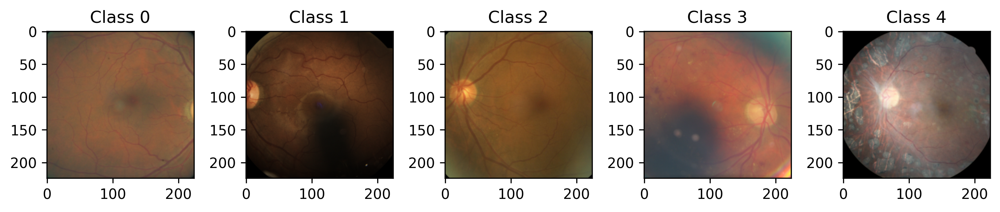

In [ ]:
ds = BaselineImageDataset(
    df=data_dfs["train_df"],
    col_info=col_info,
    transform=ResNet18_Weights.IMAGENET1K_V1.transforms()
)
show_img_examples(ds, col_info, ncols=4)

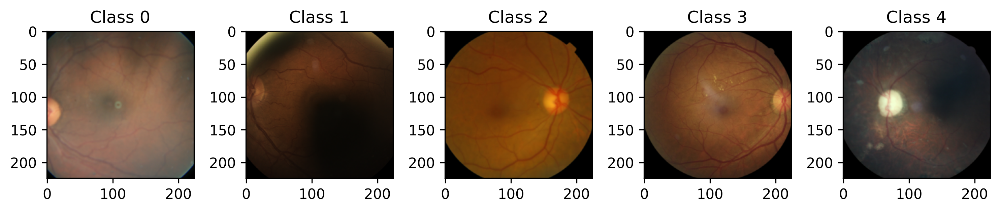

In [ ]:
data_dls = get_pytorch_split_dict(
    data_dict=data_dfs, col_info=col_info, 
    batch_size=batch_size, eval_batch_size=eval_batch_size, shuffle_train=True,
    dl_func=get_baseline_image_dl
)
show_img_examples(ds_or_dl=data_dls["train_dl"], col_info=col_info, ncols=4)

### AE Dataset

1 4


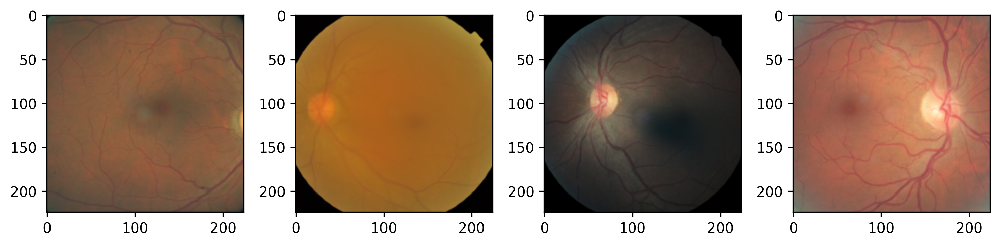

In [10]:
ds = AEImageDataset(
    df=data_dfs["train_df"],
    col_info=col_info,
    transform=ResNet18_Weights.IMAGENET1K_V1.transforms()
)
show_ae_img_examples(ds, col_info, num_examples=4, ncols=4, img_size=10)

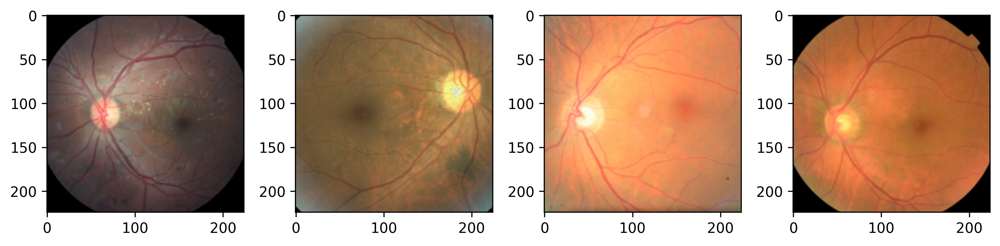

In [9]:
data_dls = get_pytorch_split_dict(
    data_dict=data_dfs, col_info=col_info, 
    batch_size=batch_size, eval_batch_size=eval_batch_size, shuffle_train=True,
    dl_func=get_ae_image_dl
)
show_ae_img_examples(ds_or_dl=data_dls["train_dl"], col_info=col_info, img_size=10)

### IC Dataset

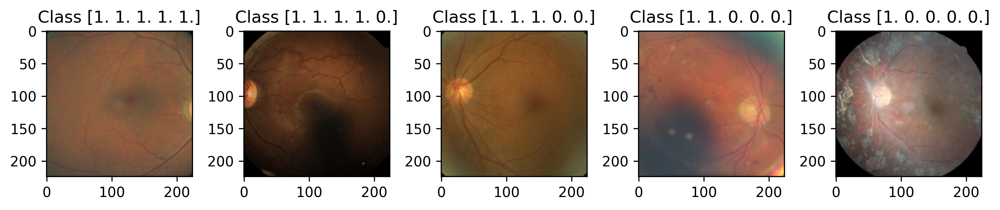

In [22]:
ds = ICImageDataset(
    df=data_dfs["train_df"],
    col_info=col_info,
    transform=ResNet18_Weights.IMAGENET1K_V1.transforms()
)
show_ic_img_examples(ds, col_info, ncols=5)

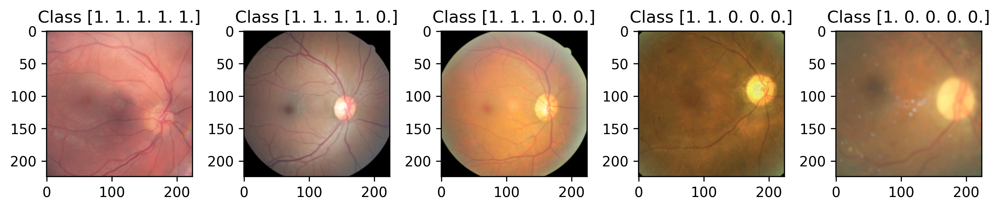

In [4]:
data_dls = get_pytorch_split_dict(
    data_dict=data_dfs, col_info=col_info, 
    batch_size=batch_size, eval_batch_size=eval_batch_size, shuffle_train=True,
    dl_func=get_ic_image_dl
)
show_ic_img_examples(ds_or_dl=data_dls["train_dl"], col_info=col_info, img_size=2)

### BC Dataset

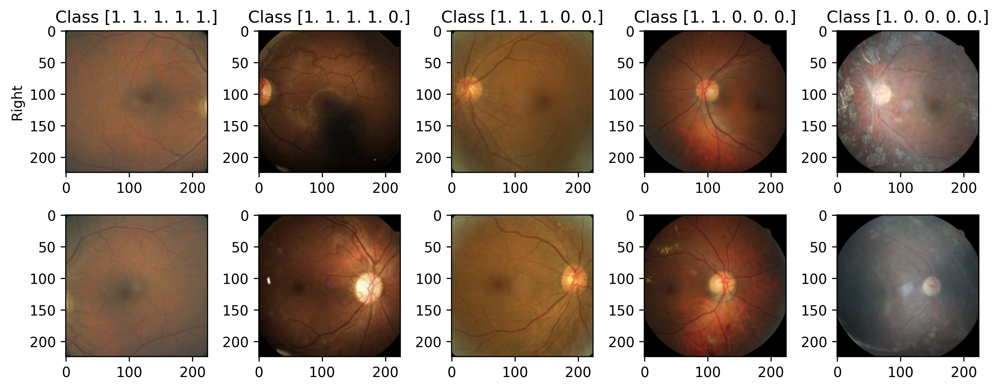

In [20]:
ds = BCImageDataset(
    df=data_dfs["train_df"],
    col_info=col_info,
    transform=ResNet18_Weights.IMAGENET1K_V1.transforms()
)
show_bc_img_examples(ds, col_info)

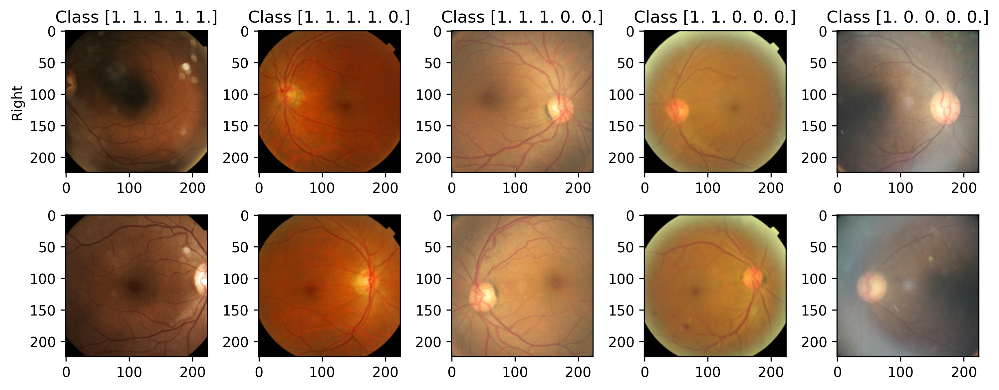

In [23]:
data_dls = get_pytorch_split_dict(
    data_dict=data_dfs, col_info=col_info, 
    batch_size=batch_size, eval_batch_size=eval_batch_size, shuffle_train=True,
    dl_func=get_bc_image_dl
)
show_bc_img_examples(ds_or_dl=data_dls["train_dl"], col_info=col_info, img_size=2)